In [1]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, push_notebook


output_notebook()


def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()
    
#내용이 중요한게 아니라, 프레임의 크기가 중요하다.
#이 함수를 운용하는데, 영상이 필요한게 아니다. 크기를 입력해도 된다.
def create_win(frames, scale=1.0) :    
    global myImage
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA) # because Bokeh expects a RGBA image
    fr=cv2.flip(fr, -1) # because Bokeh flips vertically
    width=fr.shape[1]
    height=fr.shape[0]    

    p = figure(x_range=(0,width), y_range=(0,height), output_backend="webgl", width=int(width*scale), height=int(height*scale))    
    myImage = p.image_rgba(image=[fr], x=0, y=0, dw=width, dh=height)
    show(p, notebook_handle=True)   
    
    
def update_win(frames) :
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA)
    fr=cv2.flip(fr, -1)
    myImage.data_source.data['image']=[fr]
    push_notebook()

Loading BokehJS ...

In [2]:
#단계를 여러번 거쳐가면서, 점차 얼굴로 검출되는 갯수를 줄여나가는것,
#눈은 얼굴처럼 패턴이 복잡하지 않다. 즉, 학습을 잘 시켜도, 눈이 아닌데, 눈일고 검출하는 경우가 발생한다.
#눈은 너무 고주파 성분이 없다.
classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

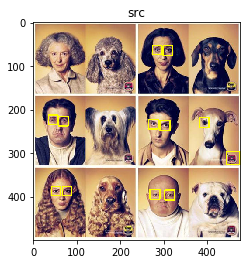

In [3]:
src = cv2.imread('dog.jpg')
faces = classifier.detectMultiScale(src)

for (x, y, w, h) in faces: #Input 이미지와 달리, 컬러/흑백은 상관 없다. 알아서, Gray Scale로 입력을 해준다.
    cv2.rectangle(src, (x,y), (x + w, y + h), (0, 255, 255), 2) #사각형을 그린다. 이미지 시작점, 끝점, 색깔
imshow('src', src)

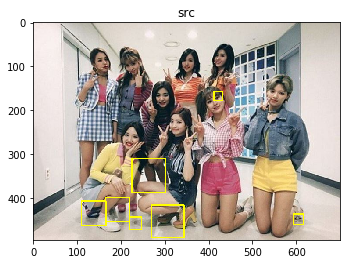

In [4]:
src = cv2.imread('twice.jpg')
faces = classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x,y), (x + w, y + h), (0, 255, 255), 2)
imshow('src', src)

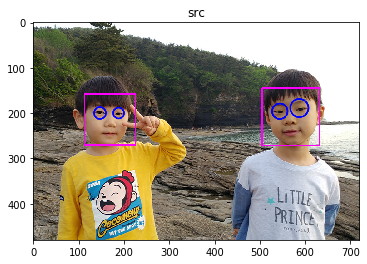

In [5]:
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

src = cv2.imread('kids.png')
#얼굴영역을 가지고 와서, 눈을 검출한다.

faces = face_classifier.detectMultiScale(src)

for (x1, y1, w1, h1) in faces:
        cv2.rectangle(src, (x1, y1), (x1 + w1, y1 + h1), (255, 0, 255), 2)

        faceROI = src[y1:y1 + h1, x1:x1 + w1] #행, 렬 ~에서 ~까지 이건 일반적인 사람의 눈을 검출할때 사용 
        #만약 src[y1:y1 + h1/2, x1:x1 + w1/2]와 같이 하면, 오검출률은 낮아지지만, 검출 해야할것을 검출 못할 수도 있다.
        
        eyes = eye_classifier.detectMultiScale(faceROI) #눈 영역 검출

        for (x2, y2, w2, h2) in eyes:
            center = (int(x2 + w2 / 2), int(y2 + h2 / 2)) #눈의 중심을 찾는다.
            cv2.circle(faceROI, center, int(w2 / 2), (255, 0, 0), 2, cv2.LINE_AA) #찾은 부분에 대하여, 원을 그린다.

imshow('src', src)  

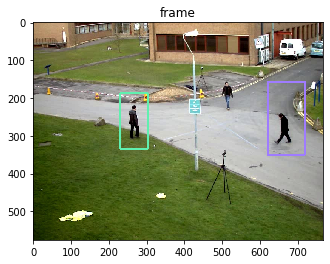

In [6]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector()) # SVM : 분류할 수 있는 최전선에 있는것, 사람검출

frame = cv2.imread("people.jpg")
detected, _ = hog.detectMultiScale(frame)

for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        #발견된 사람마다 구분하기 위해, random값으로 색깔 부여
        
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)

imshow('frame', frame)   

In [7]:
cap = cv2.VideoCapture('vtest.avi') #해당 동영상을 cap에 저장, 수를 집어 넣으면, 카메라에서 불러온다.

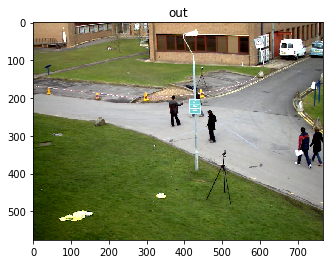

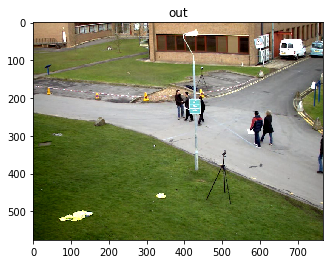

In [8]:
#jupyter notebook에서는 동영상을 바로 읽기가 나쁘다.
#그래서, 위에서 함수를 정의
for i in range(20):
    ret, frame = cap.read() #프레임을 읽어온다.
    
imshow("out", frame)

for i in range(20):
    ret, frame = cap.read()
    
imshow("out", frame)

In [9]:
create_win([frame], scale = 1.0)

In [10]:
#영상 재생
#for i in range(n), 다음 n프레임씩 가져온다.
for i in range(100):
    ret, frame = cap.read()
    update_win([frame])

In [11]:
#영상내 사람 검출
#for i in range(n), 다음 n프레임씩 가져온다.
for i in range(300) :
    ret, frame = cap.read()    
    if i == 0 : 
        create_win([frame], 0.5)
    if not ret:
        break

    detected, _ = hog.detectMultiScale(frame)

    for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))  #발견된 사람마다 구분하기 위해, random값으로 색깔 부여
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
        
    update_win([frame]) 

In [13]:
#영상내 눈 검출
cap = cv2.VideoCapture('english.mp4')

for i in range(300) :
    ret, frame = cap.read()    
    if i == 0 : 
        create_win([frame], 0.5)
    if not ret:
        break

    faces = classifier.detectMultiScale(frame)

    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 255), 2)
           
    update_win([frame])   


TypeError: Expected Ptr<cv::UMat> for argument '%s'